# Аналитическая записка "Хакатон 'Норникель: Интеллектуальные горизонты'"
Команда: *RockVision*
Задача: **Трек 1 - Флотомашина времени**  
[Условие задачи](https://buildin.ai/phystech_gensis/share/9250dd0f-aa98-4083-b06c-c7ff06533b16)  

В тетрадке преведены результаты анализа датасета. 

**Оглавление**  
[Импорты и загрузка датасета](#imports)  
[Общий анализ датасета](#base_analysis)  
[Изучение поведения концентраций и лимитов диапазонов](#conc_distribution)  
[Выявление длительности флотации](#flot_duration)  
[Определение характреных дисперсий и оклонормальное распределение](#std)  

## Импорты и загрузка датасета<a id='imports'></a>

In [ ]:
from datetime import datetime
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np
import plotly.graph_objects as go
from statsmodels.tsa.seasonal import seasonal_decompose
import scipy.stats as stats

In [40]:
import warnings
warnings.filterwarnings("ignore")

pd.options.display.max_rows = 2000
pd.set_option("max_colwidth", 400)
pd.set_option('display.max_columns', None)

In [ ]:
base_path = r'C:\Users\User\Desktop\Проекты\Хакатон_норникель\dataset\\'
file_name = r'df_hack_final.csv'
test_file = r'test.csv'

df = pd.read_csv(base_path+file_name)
test = pd.read_csv(base_path+test_file)

#предобоработка даннны
df['MEAS_DT'] = pd.to_datetime(df['MEAS_DT'])
df['Ni_rec'] = df['Ni_rec'].replace({1: None})

## Общий анализ датасета<a id='base_analysis'></a>

### Статестическое описание

In [ ]:
def explore_df(df:pd.DataFrame) -> None:
    display(f'Всего строк данных: {len(df)}')
    atr_amount = len(df.columns)
    display(f'Всего атрибутов/столбцов: {atr_amount}')
    #display(f'Имена атрибутов/столбцов: {", ".join(df.columns)}')
    display(f'Количество пропусков во всём датасете: {df.isna().sum().sum()}')
    display(f'Количество дубликатов во всём датасете: {df.duplicated().sum()}')
    display('Информация о датасете')
    display(df.info())
    display(f'Статистика по набору:')
    display(df.describe())
    display(df.sample(5))
    try:
        df.hist(figsize=(atr_amount, atr_amount))  
    except:
        print('Данных для гистограмм не обнаружено')

In [ ]:
explore_df(df)

### Анализ показателей

Из анализа изменения массы вещества на выходе из ФМ можно оценить скорость "включения" после простоя, а также общие закономерности по массам пульпы:
* 1ФМ 0 min   
* 2ФМ + 15/30 min   
* 3ФМ + 45 min   
* 4ФМ + 0/75min   
* 5ФМ + 75/90min   
* 6ФМ + 75/90min    

3ФМ по технологическому процессу существенно отличается от остальных. Вероятно, там происходит дополнительное разбавление

In [58]:
cols = ['Mass_1', 'Mass_2', 'Mass_3', 'Mass_4', 'Mass_5', 'Mass_6']

fig = px.line()
for col in cols:
    fig.add_scatter(x=df['MEAS_DT'], y=df[col], name=col)
fig.update_xaxes(title_text='Дата')
fig.update_yaxes(title_text='Массы')
fig.update_layout(title='Графики масс')

fig.show()

In [ ]:
cols = ['Dens_1', 'Dens_2', 'Dens_3', 'Dens_4', 'Dens_5', 'Dens_6']
fig = px.line()
for col in cols:
    fig.add_scatter(x=df['MEAS_DT'], y=df[col], name=col)
fig.update_xaxes(title_text='Дата')
fig.update_yaxes(title_text='Плотности')
fig.update_layout(title='Графики плотности')

fig.show()

**Питание**  
Питание Cu существенно на 1-3ФМ и существенно меньше в блоке 4-6ФМ. Вероятно, 2-3 - цепочка для обогащения на медь и на 4-6ФМ медь должна посутпать в следовых количествах.  

Обратное характерно для Ni: на 1-4ФМ его концентрация в питании практически не меняется, однако резко увеличивается на 5-6ФМ

In [ ]:
cols = ['Cu_2F', 'Cu_3F', 'Cu_4F']
fig = px.line()
for col in cols:
    fig.add_scatter(x=df['MEAS_DT'], y=df[col], name=col)
fig.update_xaxes(title_text='Дата')
fig.update_yaxes(title_text='CuFeed')
fig.update_layout(title='Графики CuFeed')

fig.show()

In [ ]:
cols = ['Ni_2F','Ni_3F','Ni_4F','Ni_5F','Ni_6F',]
fig = px.line()
for col in cols:
    fig.add_scatter(x=df['MEAS_DT'], y=df[col], name=col)

fig.update_xaxes(title_text='Дата')
fig.update_yaxes(title_text='NiFeed')
fig.update_layout(title='Графики NiFeed')

fig.show()

**Корреляции**  
Корреляции параметров на одной ФМ выявляют очевидные корреляции между свойствами пульпы (плотность, масса, объем).  

Однако других корелляций не обнаруживается, особенно между питанием ФМ и выходной концентрацией.   
Также не обнаруживается корреляций в питании разных машин и извлечением. 

In [ ]:
# col = ["Dens_6", "Mass_6", "Vol_6", "Ni_6.2C", "Ni_6.2C_max",
#        "Ni_6.2C_min", "Ni_6.2T", "Ni_6.2T_max", "Ni_6.2T_min", "FM_6.2_A", 'Ni_6F']
col = ["Dens_5", "Mass_5", "Vol_5", "Ni_5.2C", "Ni_5.2C_max",
       "Ni_5.2C_min", "Ni_5.2T", "Ni_5.2T_max", "Ni_5.2T_min", "FM_5.2_A", 'Ni_5F']
tmp = df[col]
correlation_matrix = tmp.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Корреляционная матрица')
plt.show()

In [ ]:
col = ['Ni_2F', 'Ni_3F', 'Ni_4F','Ni_5F', 'Ni_6F', 'Ni_rec']
tmp = df[col]
correlation_matrix = tmp.corr()

# Визуализация корреляционной матрицы в виде тепловой карты
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Корреляционная матрица')
plt.show()

## Изучение поведения концентраций и лимитов диапазонов<a id='conc_distribution'></a>

**Соотношение выходной концентрации и границ диапазонов**   
Наиболее интересными являются параметры необходимые для `test.csv`, а также состояние периода, характеризующегося небольшими колебаниями концентраций на всех ФМ: *24/09/2024 - 27/10/2024*  

Для отображения написана функция, которая в том числе подсвечивает периоды включённого оптимизатора.  


Заметно, что на случаются периоды, когда колебания концентраций имеют небольшую дисперсию и постоянное среднее на большей части ФМ, что позволяет работать фабирике с нечастыми изменениями парамтеров флотации.  

Также, выявлены данные, в которых диапазоны не изменялись и совершенно не соотвествовали концентрациям (см. `Ni_3.1C`). 

In [ ]:
def plot_min_max_curr(df, col, prod, opt):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df['MEAS_DT'], y=df[col+prod],
                            mode='markers',
                            name=col+prod,
                            marker=dict(color=df[opt])))

    fig.add_trace(go.Scatter(x=df['MEAS_DT'], y=df[col+prod+'_max'],
                            mode='markers',
                            # mode='lines',
                            name=col+prod+'_max'))

    fig.add_trace(go.Scatter(x=df['MEAS_DT'], y=df[col+prod+'_min'],
                            mode='markers',
                            name=col+prod+'_min'))

    fig.update_layout(
        title=f'Зависимость {col}{prod} от времени',
        xaxis_title='Время (MEAS_DT)',
        yaxis_title=f'Значения {col}{prod}',
        legend_title='Параметры',
        hovermode='x unified'
    )
    fig.show()

In [ ]:
date_start = datetime(2024, 9, 24, 0, 0, 0)
date_end = datetime(2024, 10, 27, 0, 0, 0)
filtered = df.query('MEAS_DT>@date_start & MEAS_DT<@date_end')
#filtered = df
plot_min_max_curr(filtered, 'Ni_5.1', 'C', 'FM_5.1_A')
plot_min_max_curr(filtered, 'Ni_5.2', 'C', 'FM_5.2_A')
plot_min_max_curr(filtered, 'Ni_6.1', 'C', 'FM_6.1_A')
plot_min_max_curr(filtered, 'Ni_6.2', 'C', 'FM_6.2_A')

plot_min_max_curr(filtered, 'Ni_3.1', 'C', 'FM_3.1_A')


## Выявление длительности флотации<a id='flot_duration'></a>

**Определение периода времени на прохождение всех ФМ**  
Для определения был найден временной промежуток, когда `Ore_mass` равнялся 0. И выбран самый длинный такой случай: 07/10/2024 с 13:00 по 16:30.  

Отслеживая "пропадания" вещества на ФМ можно примерно определить время прохождения вещества по ФМ:  
`filtered['Cu_1.1C']` 15:00 - 18:00 / +2ч  
`filtered['Cu_1.2C']` 15:15 - 18:00 / +2ч  
`filtered['Cu_2.1C']` 19:45 - 20:15 / +6.5ч  
`filtered['Ni_5.1C']` 20:30 - 23:30 (с перерывами) / +7.5ч  
`filtered['Ni_6.2C']` 00:15 - 01:00 / +12ч    

Определить лаг поступления вещества в ФМ по цепочке можно наблюдая график масс в моменты запуска фабрики после простоя линии. Как было показано выше.

In [59]:
date_start = datetime(2024, 10, 7, 0, 0, 0)
date_end = datetime(2024, 10, 8, 20, 0, 0)

filtered = df.query('MEAS_DT>@date_start & MEAS_DT<@date_end')
fig = px.line()
fig.add_scatter(x=filtered['MEAS_DT'], y=filtered['Ore_mass'], name='Ore_mass', mode='lines+markers')
col = 'Cu_1.1C'
fig.add_scatter(x=filtered['MEAS_DT'], y=filtered[col], name=col, mode='markers')

## Определение характреных дисперсий и оклонормальное распределение<a id='std'></a>

На некоторых, достаточно длинных отрезках времени, для нескольких ФМ изменение концентраций описывается **нормальным законом**, а значит определить диапазоны можно в соответствии с нормальным законом.  
Средняя дисперсия значений для многих ФМ не велика, однако максимальная дисперсия может быть очень значимой, в частности, из-за остановок фабрики и поступления пустой породы.

`count_window_std` - функция для расчета средней дисперсии с заданным окном.

Statistics=0.999, p=0.254
Нулевая гипотеза НЕ может быть отвергнута


<Axes: >

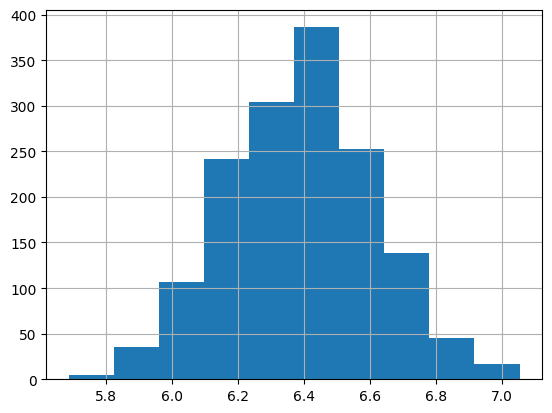

In [56]:
date_start = datetime(2024, 10, 24, 0, 0, 0)
date_end = datetime(2024, 11, 9, 0, 0, 0)
filtered = df.query('MEAS_DT>@date_start & MEAS_DT<@date_end')

column = 'Ni_5.1'
fm_a = 'FM_5.1_A'
alpha = 0.05
stat, p = stats.shapiro(filtered[column+'C'].dropna())
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > alpha:
    print('Нулевая гипотеза НЕ может быть отвергнута')
else:
    print('Нулевая гипотеза может быть отвергнута')

plot_min_max_curr(filtered, column, 'C', fm_a)
filtered[column+'C'].hist()

In [36]:
def notNaN(num):
    return num == num

def count_window_std(df, col, time_delta):
    df[col].fillna(df[col].mean())
    start_time = df['MEAS_DT'].iloc[0]
    end_time = start_time + pd.Timedelta(minutes=time_delta)
    dispersion = []
    while end_time < df['MEAS_DT'].iloc[-1]:
        index = df.index & ((df['MEAS_DT'] >= start_time) & (df['MEAS_DT'] <= end_time))
        start_time = end_time
        end_time += pd.Timedelta(minutes=time_delta)

        if notNaN(df[index][col].std()):
            dispersion.append(df[index][col].std())
        else:
            start_time = start_time
            end_time += pd.Timedelta(minutes=time_delta)
    
    print(f'При окне в {time_delta} мин, максимальная дисперсия {max(dispersion):.2f},'\
          f'средняя дисперсия {sum(dispersion)/len(dispersion):.2f}')
    
    return np.array(dispersion).astype(float)

In [ ]:
date_start = datetime(2024, 10, 6, 0, 0, 0)
date_end = datetime(2024, 11, 11, 0, 0, 0)
filtered = df.query('MEAS_DT>@date_start & MEAS_DT<@date_end')

disp_cu = count_window_std(filtered, 'Cu_1.1C', 120)
disp_ni = count_window_std(filtered, 'Ni_1.1C', 60)

При окне в 120 мин, максимальная дисперсия 0.57,средняя дисперсия 0.10
При окне в 60 мин, максимальная дисперсия 0.39,средняя дисперсия 0.07


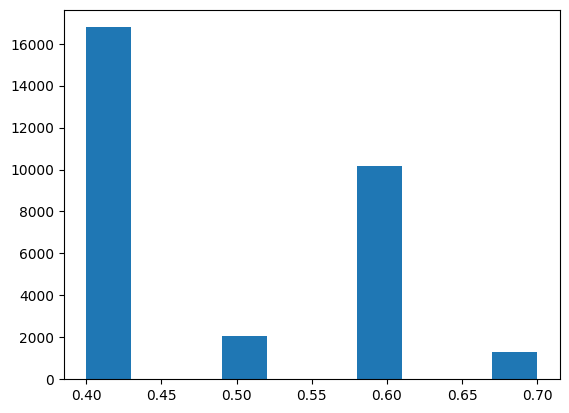

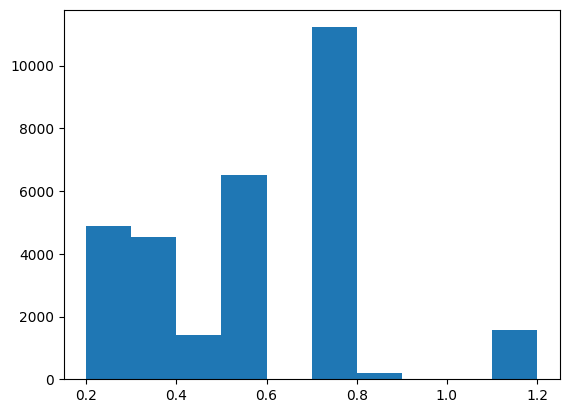

In [ ]:
df.columns.to_list()
maxs = [x for x in df.columns.to_list() if 'max' in x]
mins = [x for x in df.columns.to_list() if 'min' in x]

diaposons = df[['MEAS_DT', 'Cu_1.2C_max', 'Cu_1.2C_min',
                'Cu_1.1C_max', 'Cu_1.1C_min',
                'Ni_1.1C_max', 'Ni_1.1C_min', 'Ni_1.2C_max', 'Ni_1.2C_min']]
diaposons['Cu_1.2C_diff'] = diaposons['Cu_1.2C_max']-diaposons['Cu_1.2C_min']
diaposons['Ni_1.2C_diff'] = diaposons['Ni_1.2C_max']-diaposons['Ni_1.2C_min']
diaposons['Ni_1.2C_roll'] = diaposons['Ni_1.2C_diff'].rolling(32).mean()
diaposons['Cu_1.2C_roll'] = diaposons['Cu_1.2C_diff'].rolling(32).mean()
plt.hist(diaposons['Ni_1.2C_diff'])
plt.show()
plt.hist(diaposons['Cu_1.2C_diff'])
plt.show()

fig = go.Figure()
fig.add_trace(go.Scatter(x=diaposons['MEAS_DT'], y=diaposons['Cu_1.2C_roll'], name='Cu_1.2C_roll'))
fig.add_trace(go.Scatter(x=diaposons['MEAS_DT'], y=diaposons['Ni_1.2C_roll'], name='Ni_1.2C_roll'))

fig.update_layout(
    title='Диапозоны по времени',
    xaxis_title='Время (MEAS_DT)',
)
fig.show()